Prompt used in Claude AI:

I am working on a project where I am using google colab (python) to predict liquefaction from aerial imagery using a CNN. So far, I have extracted 12 tiles from LINZ aerial imagery over Christchurch NZ. I have stored these tiles in my dropbox. 4 tiles correspond to high risk, 4 medium risk and 4 low risk.

What I need help with is the following:

First, write some code to import the tiles. They are currently stored in my drop box. I do not want to download them to my computer, just straight into colab.
Inspect each tiles properties. They should be 4800x7200 pixels, but I want to confirm
Then, extract 500 patches from each tile. Download them back to the drop box or store them in some way that I do not have to re-run the patch extraction everytime and I can just use the patches directly. I also want to know which patches belong to which category (high, med, low).
Here is some additional information about the tiles that may be useful.

risk cateogoryTile ID Approx Cooordinates
Predominant land cover
High riskBX241229172°43'16"E 43°31'3"S
Suburban/wetland with river
High riskBX241125172.6981010, -43.51146219
Wainoni park (grass and roads)
High riskBX241722172.6808280, -43.54901668
river/industrial area
High riskBX241714172.6336605, -43.54742813
2 lane each side highway, industrial
medium riskBX241420172.6683228, -43.53128358
suburban/built up main road
medium riskBX241520172.6710959, -43.53552336
park (grass) and suburb
medium riskBX241809172.6050770, -43.55770704
suburban with river
medium riskBX241812172.6200621, -43.55659898industriallow riskBX240720172.6702853, -43.48648883
rural with sheds (industrial) next to a main rd
low riskBX231644172.5153499, -43.54064490
train line suburban main roads
low riskBX231544172.5129460, -43.53309273
Field with road and suburban edge
low riskBX231250172.5532335, -43.51814653
suburban with evidence of stream (willows)

Response:

I'll help you create a comprehensive solution for importing aerial imagery tiles from Dropbox, inspecting them, and extracting patches. Here's a complete workflow:

Liquefaction CNN Data Preparation Pipeline
Code
I've created a comprehensive pipeline for your liquefaction prediction project! Here's what the code does:

Key Features:
1. Import Tiles from Dropbox
Loads images directly into Colab memory without downloading to your computer
Uses the Dropbox API with proper authentication
2. Inspect Tile Properties
Verifies dimensions (should be 4800x7200 or 7200x4800)
Reports image mode, format, data type, and basic statistics
Warns if dimensions don't match expected values
3. Extract and Store Patches
Extracts 500 random patches (224x224 pixels by default) from each tile
Saves patches back to Dropbox in organized folders: /patches/{risk_category}/{tile_id}/
Maintains metadata about which patches belong to which category
Includes visualization of sample patches
4. Reusable Loading Function
Provides load_patches_for_training() for future runs
Loads pre-extracted patches directly without re-processing
Returns organized data ready for CNN training
Setup Instructions:
Get Dropbox Access Token:
Go to https://www.dropbox.com/developers/apps
Create a new app with "Scoped access" and "Full Dropbox"
Enable permissions: files.content.read and files.content.write
Generate an access token and paste it in the code
Update Parameters:
DROPBOX_TILES_PATH: Path to your tiles folder (currently set to /tiles)
PATCH_SIZE: Adjust if you need different sized patches (default: 224)
File extension: Change .tif to match your actual file format if different
Run the Pipeline:
First run: Extracts all patches and saves to Dropbox
Future runs: Use load_patches_for_training() to load pre-extracted patches
The metadata JSON file tracks all tiles, their risk categories, and patch counts, making it easy to organize your training data!


In [28]:
"""
Liquefaction Risk Prediction - Data Preparation Pipeline
Extracts patches from aerial imagery tiles stored in Dropbox
"""

# ============================================================================
# PART 1: SETUP AND IMPORTS
# ============================================================================

# Install required packages
!pip install dropbox pillow numpy matplotlib

import dropbox
import io
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import json
import random
from typing import List, Tuple, Dict

In [29]:
# ============================================================================
# PART 2: DROPBOX AUTHENTICATION
# ============================================================================

# You'll need to create a Dropbox app and get an access token
# Instructions:
# 1. Go to https://www.dropbox.com/developers/apps
# 2. Click "Create app"
# 3. Choose "Scoped access" and "Full Dropbox"
# 4. Name your app
# 5. Go to "Permissions" tab and enable files.content.read and files.content.write
# 6. Go to "Settings" tab and generate an access token

DROPBOX_ACCESS_TOKEN = "sl.u.AGDkedxakkSfHaOj9wgDWlK_1-Tk-8QkGmvl5LGYaKS85QPzRDXRBSMckXBkSWOzDJIWrR2UFIATXIhXQPa1a0B9N8SpCBnhI0UXIoUMkjUY1MpGZASMJLKHKHhTm_qu04bDOd3gP82f4f8qC9Ee9o2EuBgVO5Z2I0FYu3W7C4aZiZREiefn9q05RtLhJpGHLwow9XHJK4kTxS4WrcposnyeoYcH6H6dyE-5vMSfNKeUX4PyMC9xn5b6TMD-yMdTlmBR5JB2hUiG6vdhwed_W6G1R-QObAwvWakdDEdkQiQYZNJTUj5e5CJzal7cshNGlPus59EwZ2FuK4ZCgUMARUZC4s0eZMoEnTZyUoc_RArmg09BuPjfXWetMrUedQINvGoH-1yHI60l41sRkGIcuSsZHBsjDc-mTmy3uRIjZzDRbo0dMAkwHOwQxWL96DG9zH76viKD4BdCe81pqSFdbxN8K36QXo-aCr6ZzGUnboKwVULnDOgthBstuOvRCAuSDuGxkubpDPeOwqek-c1C32hV4DRAZS6k7GI7Pq--jmZMe3Ur7ScdaFDHjGnGaHz-rIqoQhn5a7Vpg7BLja4xfgtI8yT7UtMPq2i284Kj1vm2e4F9EwT-uprgIkf8MMOt7YxMDAWmB3hOXRu-lIXCwjdORQlpaKVF9CYwzlQB7bNySHdzW5LhdDN1q837wR4gyTsJkjC1ve0PrIvp6d_-tqzogrrSVWwmnhy31nghzL_lvLNSmHzr1r_cA1PhbJzpTagWk8LlEZR7RWlgOKaC0chofWj9pOPtxrb9xXqTR27XlBQsGs_SSP0hRvxjtx7RFd5AwtGgEflRTvQ1YgHFe4AkDcBOKGAZTAccvOjSPkMM1g9wM1BHme1oAYtumDujyQdn5ZEBlaygep97uC_IViGBzeW1-aXmyVFKE0J6a60nwqxP8ukTc7DaI6zBo4l2dNbUoQDDB7JNvkief_gRdoUFjaEMNqVW9zALu-rznCFvKOpQncU-oYNQ7sTxraO3oSyZYkct0G_Thza8yaeKzTuNpuD9XrqTZNMAaM9_XtFIdheOU3WKOQdSrBLxicyBr9XuVKDzWUZiXCdBaukgJfSjcRDxED-EdV9YxIiiQlL_T27iTeDpEm81HOl1olBjVu_zD5O_aYsAfgSlae9Q76hkfeMGL5yiDOrNVwaWvy9IEW3vYOSSYi3_fbcs7nif6NF7xh-mRcZvBUAGIIswkwnA4aNspGbIz_p-RrbrWDTwBNB3rRSIi8lnaHjmbJNbOHreIok7iGhctqu-Z5tXmaDEn0sem36CLa7jiGNICrbO8bLTQRgYyAMY4KKhd9v3x4C32IgWr3rHDjh_bnTwM0jmckCcxkxB9eIMlHaGqpI8OhRFnRVHLBEXsjOlQH-8A7mf3JnUre680H-_efFKQ_Lf"  # Replace with your token

# Initialize Dropbox client
dbx = dropbox.Dropbox(DROPBOX_ACCESS_TOKEN)

In [30]:
# ============================================================================
# PART 3: TILE METADATA
# ============================================================================

# Define tile information
TILES_INFO = {
    'high_risk': [
        {'tile_id': 'BX241229', 'coords': (172.72111, -43.51750), 'description': 'Suburban/wetland with river'},
        {'tile_id': 'BX241125', 'coords': (172.6981010, -43.51146219), 'description': 'Wainoni park (grass and roads)'},
        {'tile_id': 'BX241722', 'coords': (172.6808280, -43.54901668), 'description': 'River/industrial area'},
        {'tile_id': 'BX241714', 'coords': (172.6336605, -43.54742813), 'description': '2 lane highway, industrial'}
    ],
    'medium_risk': [
        {'tile_id': 'BX241420', 'coords': (172.6683228, -43.53128358), 'description': 'Suburban/built up main road'},
        {'tile_id': 'BX241520', 'coords': (172.6710959, -43.53552336), 'description': 'Park (grass) and suburb'},
        {'tile_id': 'BX241809', 'coords': (172.6050770, -43.55770704), 'description': 'Suburban with river'},
        {'tile_id': 'BX241812', 'coords': (172.6200621, -43.55659898), 'description': 'Suburban industrial'}
    ],
    'low_risk': [
        {'tile_id': 'BX240720', 'coords': (172.6702853, -43.48648883), 'description': 'Rural with sheds next to main rd'},
        {'tile_id': 'BX231644', 'coords': (172.5153499, -43.54064490), 'description': 'Train line suburban main roads'},
        {'tile_id': 'BX231544', 'coords': (172.5129460, -43.53309273), 'description': 'Field with road and suburban edge'},
        {'tile_id': 'BX231250', 'coords': (172.5532335, -43.51814653), 'description': 'Suburban with stream evidence'}
    ]
}

In [31]:
# ============================================================================
# PART 4: HELPER FUNCTIONS
# ============================================================================

def load_image_from_dropbox(dbx, dropbox_path: str) -> Image.Image:
    """
    Load an image directly from Dropbox into memory

    Args:
        dbx: Dropbox client
        dropbox_path: Path to file in Dropbox (e.g., '/Chch%20tiles/BX241229.zip')

    Returns:
        PIL Image object
    """
    try:
        metadata, response = dbx.files_download(dropbox_path)
        image_data = response.content
        image = Image.open(io.BytesIO(image_data))
        return image
    except Exception as e:
        print(f"Error loading {dropbox_path}: {e}")
        return None

def inspect_tile_properties(image: Image.Image, tile_id: str, risk_category: str):
    """
    Inspect and print tile properties

    Args:
        image: PIL Image object
        tile_id: Tile identifier
        risk_category: Risk level (high, medium, low)
    """
    print(f"\n{'='*60}")
    print(f"Tile ID: {tile_id}")
    print(f"Risk Category: {risk_category}")
    print(f"{'='*60}")
    print(f"Dimensions: {image.size[0]}x{image.size[1]} pixels")
    print(f"Mode: {image.mode}")
    print(f"Format: {image.format}")

    # Convert to numpy array for additional info
    img_array = np.array(image)
    print(f"Array shape: {img_array.shape}")
    print(f"Data type: {img_array.dtype}")
    print(f"Min value: {img_array.min()}")
    print(f"Max value: {img_array.max()}")
    print(f"Mean value: {img_array.mean():.2f}")

    return img_array.shape

def extract_patches(image: Image.Image, patch_size: int = 256,
                   num_patches: int = 500, seed: int = 42) -> List[np.ndarray]:
    """
    Extract random patches from an image

    Args:
        image: PIL Image object
        patch_size: Size of square patches to extract
        num_patches: Number of patches to extract
        seed: Random seed for reproducibility

    Returns:
        List of numpy arrays (patches)
    """
    random.seed(seed)
    np.random.seed(seed)

    img_array = np.array(image)
    height, width = img_array.shape[:2]

    patches = []

    # Calculate valid extraction regions
    max_y = height - patch_size
    max_x = width - patch_size

    for i in range(num_patches):
        # Random top-left corner
        y = random.randint(0, max_y)
        x = random.randint(0, max_x)

        # Extract patch
        patch = img_array[y:y+patch_size, x:x+patch_size]
        patches.append(patch)

    return patches

def save_patches_to_dropbox(dbx, patches: List[np.ndarray],
                            tile_id: str, risk_category: str,
                            dropbox_base_path: str = '/patches'):
    """
    Save patches to Dropbox as PNG files

    Args:
        dbx: Dropbox client
        patches: List of patch arrays
        tile_id: Tile identifier
        risk_category: Risk level
        dropbox_base_path: Base directory in Dropbox for patches
    """
    # Create directory structure
    category_path = f"{dropbox_base_path}/{risk_category}"
    tile_path = f"{category_path}/{tile_id}"

    saved_count = 0

    for idx, patch in enumerate(patches):
        try:
            # Convert numpy array to PNG bytes
            patch_image = Image.fromarray(patch.astype('uint8'))
            buffer = io.BytesIO()
            patch_image.save(buffer, format='PNG')
            buffer.seek(0)

            # Upload to Dropbox
            file_path = f"{tile_path}/patch_{idx:04d}.png"
            dbx.files_upload(buffer.read(), file_path,
                           mode=dropbox.files.WriteMode.overwrite)
            saved_count += 1

            if (idx + 1) % 100 == 0:
                print(f"  Saved {idx + 1}/{len(patches)} patches...")

        except Exception as e:
            print(f"Error saving patch {idx}: {e}")

    print(f"  Total saved: {saved_count}/{len(patches)} patches")
    return saved_count

def visualize_sample_patches(patches: List[np.ndarray], num_samples: int = 6):
    """
    Visualize a sample of extracted patches

    Args:
        patches: List of patch arrays
        num_samples: Number of patches to display
    """
    sample_indices = random.sample(range(len(patches)), min(num_samples, len(patches)))

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.flatten()

    for idx, patch_idx in enumerate(sample_indices):
        axes[idx].imshow(patches[patch_idx])
        axes[idx].set_title(f'Patch {patch_idx}')
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()


In [32]:
# ============================================================================
# PART 5: MAIN PROCESSING PIPELINE
# ============================================================================

def process_all_tiles(dbx, tiles_info: Dict,
                     dropbox_tiles_path: str = '/Chch%20tiles',
                     patch_size: int = 256,
                     num_patches_per_tile: int = 500,
                     visualize: bool = True):
    """
    Main pipeline to process all tiles

    Args:
        dbx: Dropbox client
        tiles_info: Dictionary with tile information
        dropbox_tiles_path: Path to tiles in Dropbox
        patch_size: Size of patches to extract
        num_patches_per_tile: Number of patches per tile
        visualize: Whether to show sample patches
    """

    metadata = {
        'patch_size': patch_size,
        'num_patches_per_tile': num_patches_per_tile,
        'tiles': {}
    }

    total_patches = 0

    for risk_category, tiles in tiles_info.items():
        print(f"\n{'#'*60}")
        print(f"Processing {risk_category.upper()} tiles")
        print(f"{'#'*60}")

        for tile_info in tiles:
            tile_id = tile_info['tile_id']

            # Construct Dropbox path (adjust extension if needed: .tif, .tiff, .jpg, .png)
            tile_path = f"{dropbox_tiles_path}/{tile_id}.tif"

            print(f"\nLoading tile: {tile_id}")

            # Load image
            image = load_image_from_dropbox(dbx, tile_path)

            if image is None:
                print(f"Skipping {tile_id} due to loading error")
                continue

            # Inspect properties
            shape = inspect_tile_properties(image, tile_id, risk_category)

            # Check if dimensions match expected
            if image.size != (7200, 4800) and image.size != (4800, 7200):
                print(f"WARNING: Unexpected dimensions! Expected 4800x7200 or 7200x4800")

            # Extract patches
            print(f"\nExtracting {num_patches_per_tile} patches...")
            patches = extract_patches(image, patch_size, num_patches_per_tile)

            # Visualize sample patches
            if visualize:
                print("Visualizing sample patches...")
                visualize_sample_patches(patches)

            # Save patches to Dropbox
            print(f"Saving patches to Dropbox...")
            saved = save_patches_to_dropbox(dbx, patches, tile_id, risk_category)

            # Update metadata
            metadata['tiles'][tile_id] = {
                'risk_category': risk_category,
                'dimensions': image.size,
                'num_patches': saved,
                'description': tile_info['description'],
                'coords': tile_info['coords']
            }

            total_patches += saved

    # Save metadata
    print(f"\n{'='*60}")
    print(f"PROCESSING COMPLETE")
    print(f"{'='*60}")
    print(f"Total patches extracted: {total_patches}")
    print(f"Saving metadata...")

    metadata_json = json.dumps(metadata, indent=2)
    metadata_bytes = metadata_json.encode('utf-8')
    dbx.files_upload(metadata_bytes, '/patches/metadata.json',
                    mode=dropbox.files.WriteMode.overwrite)

    return metadata

In [33]:
# ============================================================================
# PART 6: EXECUTE PIPELINE
# ============================================================================

if __name__ == "__main__":
    # Run the complete pipeline
    print("Starting liquefaction data preparation pipeline...")

    # Adjust these parameters as needed
    DROPBOX_TILES_PATH = '/Chch%20tiles'  # Your tiles folder in Dropbox
    PATCH_SIZE = 256  # Standard size for many CNNs
    NUM_PATCHES = 500  # Per tile

    metadata = process_all_tiles(
        dbx=dbx,
        tiles_info=TILES_INFO,
        dropbox_tiles_path=DROPBOX_TILES_PATH,
        patch_size=PATCH_SIZE,
        num_patches_per_tile=NUM_PATCHES,
        visualize=True
    )

    print("\nMetadata summary:")
    print(json.dumps(metadata, indent=2))

Starting liquefaction data preparation pipeline...

############################################################
Processing HIGH_RISK tiles
############################################################

Loading tile: BX241229
Error loading /Chch%20tiles/BX241229.tif: ApiError('84f4e555f7374d9b91c908055cb8c850', DownloadError('path', LookupError('not_found', None)))
Skipping BX241229 due to loading error

Loading tile: BX241125
Error loading /Chch%20tiles/BX241125.tif: ApiError('895543898b9c4e7a82d64ecd14bbfd32', DownloadError('path', LookupError('not_found', None)))
Skipping BX241125 due to loading error

Loading tile: BX241722
Error loading /Chch%20tiles/BX241722.tif: ApiError('8c9875f6ddf74a58bb509628e4860a2d', DownloadError('path', LookupError('not_found', None)))
Skipping BX241722 due to loading error

Loading tile: BX241714
Error loading /Chch%20tiles/BX241714.tif: ApiError('d5749fb10a08432f8fb113ebefface19', DownloadError('path', LookupError('not_found', None)))
Skipping BX241714 

In [34]:
# ============================================================================
# PART 7: LOADING PATCHES FOR TRAINING (USE THIS IN FUTURE RUNS)
# ============================================================================

def load_patches_for_training(dbx, metadata_path: str = '/patches/metadata.json',
                              patches_base_path: str = '/patches'):
    """
    Load patches from Dropbox for model training
    Use this function in future notebooks to avoid re-extracting patches

    Args:
        dbx: Dropbox client
        metadata_path: Path to metadata JSON in Dropbox
        patches_base_path: Base path to patches in Dropbox

    Returns:
        Dictionary with patches organized by risk category
    """
    # Load metadata
    _, response = dbx.files_download(metadata_path)
    metadata = json.loads(response.content)

    patches_data = {'high_risk': [], 'medium_risk': [], 'low_risk': []}
    labels = {'high_risk': [], 'medium_risk': [], 'low_risk': []}

    # Map risk categories to numeric labels
    risk_to_label = {'high_risk': 2, 'medium_risk': 1, 'low_risk': 0}

    for tile_id, tile_info in metadata['tiles'].items():
        risk = tile_info['risk_category']
        num_patches = tile_info['num_patches']

        print(f"Loading {num_patches} patches from {tile_id} ({risk})...")

        for patch_idx in range(num_patches):
            try:
                patch_path = f"{patches_base_path}/{risk}/{tile_id}/patch_{patch_idx:04d}.png"
                _, response = dbx.files_download(patch_path)
                img = Image.open(io.BytesIO(response.content))
                img_array = np.array(img)

                patches_data[risk].append(img_array)
                labels[risk].append(risk_to_label[risk])

            except Exception as e:
                print(f"Error loading patch {patch_idx} from {tile_id}: {e}")

    return patches_data, labels, metadata

# Example usage for loading patches in future runs:
# patches_data, labels, metadata = load_patches_for_training(dbx)
# X_high = np.array(patches_data['high_risk'])
# y_high = np.array(labels['high_risk'])
# ... combine all categories and train your CNN

LIQUEFACTION PATCH DATASET LOADER
Loading metadata...
✓ Metadata loaded successfully
  Patch size: 256x256
  Patches per tile: 500

Loading patches from Dropbox...

DATASET SUMMARY
Total patches loaded: 0
Dataset shape: (0,)
Labels shape: (0,)

Class distribution:
  Low Risk: 0 patches (nan%)
  Medium Risk: 0 patches (nan%)
  High Risk: 0 patches (nan%)

DISPLAYING RANDOM PATCHES


/tmp/ipython-input-643105219.py:110: RuntimeWarning: invalid value encountered in scalar divide
  percentage = (count / len(y)) * 100


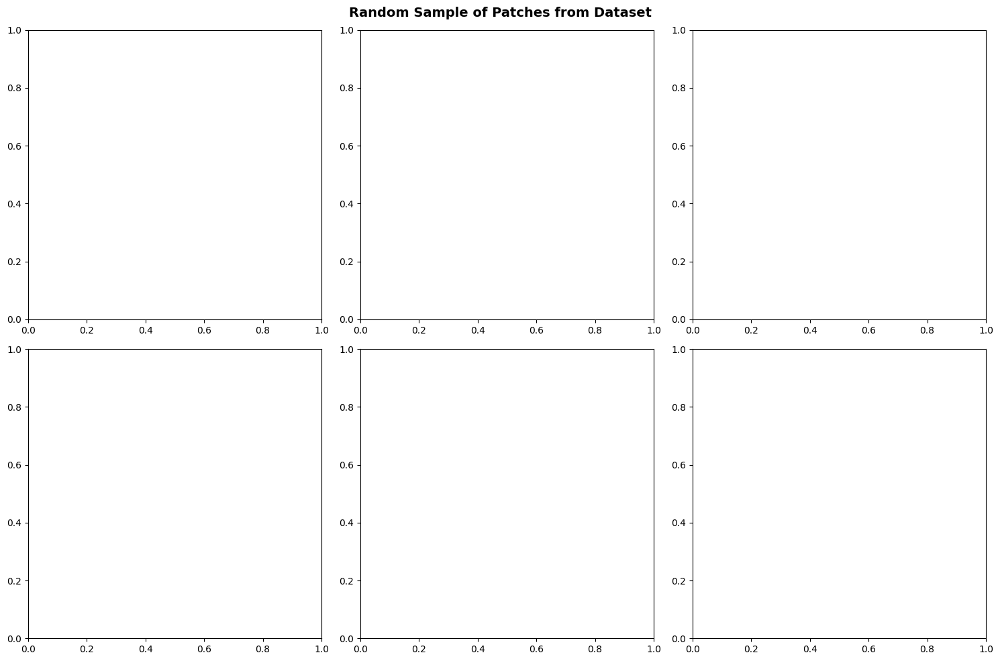


Displayed Patch Details:

DISPLAYING PATCHES BY CATEGORY


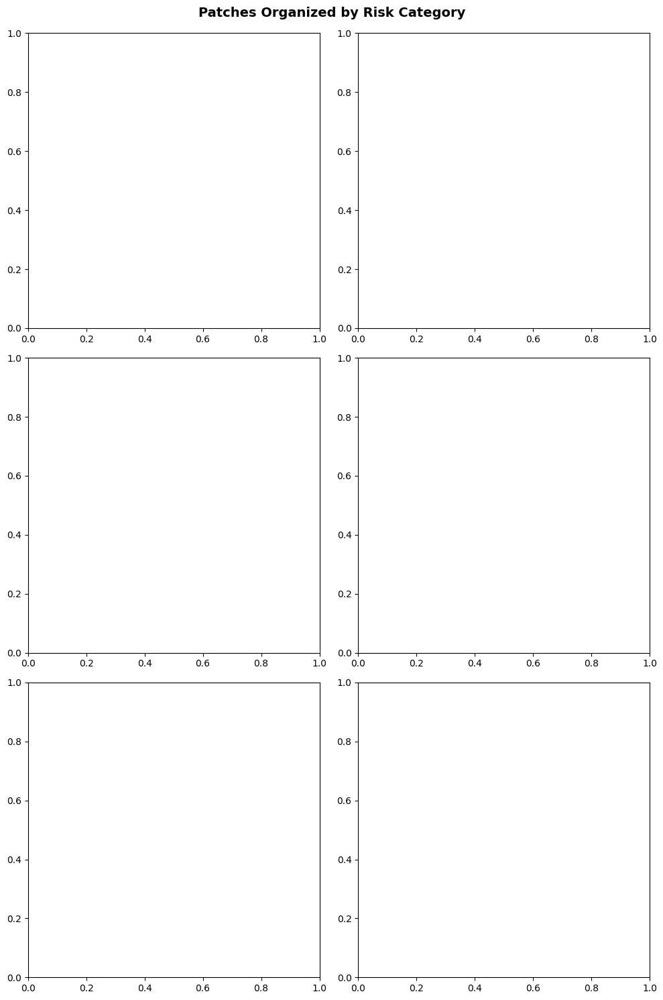


Dataset is ready for CNN training!

Variables available:
  X: numpy array of patches, shape: (0,)
  y: numpy array of labels, shape: (0,)
  dataset_info: dictionary with metadata


In [35]:
"""
Load extracted patches from Dropbox and display random samples
"""

import dropbox
import io
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
import json
import random

# ============================================================================
# SETUP
# ============================================================================

# Use the same Dropbox access token
#DROPBOX_ACCESS_TOKEN = "YOUR_ACCESS_TOKEN_HERE"  # Replace with your token
#dbx = dropbox.Dropbox(DROPBOX_ACCESS_TOKEN)

# ============================================================================
# LOAD PATCHES FUNCTION
# ============================================================================

def load_all_patches_from_dropbox(dbx, metadata_path='/patches/metadata.json',
                                   patches_base_path='/patches'):
    """
    Load all patches from Dropbox with their labels

    Returns:
        X: numpy array of all patches
        y: numpy array of labels (0=low, 1=medium, 2=high)
        metadata: dictionary with dataset information
    """
    print("Loading metadata...")

    # Load metadata
    try:
        _, response = dbx.files_download(metadata_path)
        metadata = json.loads(response.content)
        print(f"✓ Metadata loaded successfully")
        print(f"  Patch size: {metadata['patch_size']}x{metadata['patch_size']}")
        print(f"  Patches per tile: {metadata['num_patches_per_tile']}")
    except Exception as e:
        print(f"Error loading metadata: {e}")
        return None, None, None

    # Prepare data structures
    all_patches = []
    all_labels = []
    all_tile_ids = []
    all_risk_categories = []

    # Map risk categories to numeric labels
    risk_to_label = {'high_risk': 2, 'medium_risk': 1, 'low_risk': 0}
    label_names = {0: 'Low Risk', 1: 'Medium Risk', 2: 'High Risk'}

    print("\nLoading patches from Dropbox...")
    print("="*60)

    total_loaded = 0

    for tile_id, tile_info in metadata['tiles'].items():
        risk = tile_info['risk_category']
        num_patches = tile_info['num_patches']
        label = risk_to_label[risk]

        print(f"\n{tile_id} ({risk}):")
        print(f"  Loading {num_patches} patches...", end=" ")

        loaded_count = 0

        for patch_idx in range(num_patches):
            try:
                # Construct patch path
                patch_path = f"{patches_base_path}/{risk}/{tile_id}/patch_{patch_idx:04d}.png"

                # Download and load patch
                _, response = dbx.files_download(patch_path)
                img = Image.open(io.BytesIO(response.content))
                img_array = np.array(img)

                # Store patch and metadata
                all_patches.append(img_array)
                all_labels.append(label)
                all_tile_ids.append(tile_id)
                all_risk_categories.append(risk)

                loaded_count += 1

            except Exception as e:
                print(f"\n  Error loading patch {patch_idx}: {e}")

        print(f"✓ {loaded_count} patches loaded")
        total_loaded += loaded_count

    # Convert to numpy arrays
    X = np.array(all_patches)
    y = np.array(all_labels)

    print("\n" + "="*60)
    print("DATASET SUMMARY")
    print("="*60)
    print(f"Total patches loaded: {total_loaded}")
    print(f"Dataset shape: {X.shape}")
    print(f"Labels shape: {y.shape}")
    print(f"\nClass distribution:")
    for label_val, label_name in label_names.items():
        count = np.sum(y == label_val)
        percentage = (count / len(y)) * 100
        print(f"  {label_name}: {count} patches ({percentage:.1f}%)")

    # Create extended metadata
    dataset_info = {
        'metadata': metadata,
        'tile_ids': all_tile_ids,
        'risk_categories': all_risk_categories,
        'label_names': label_names,
        'risk_to_label': risk_to_label
    }

    return X, y, dataset_info

# ============================================================================
# DISPLAY RANDOM PATCHES
# ============================================================================

def display_random_patches(X, y, dataset_info, num_samples=6, seed=42):
    """
    Display random patches from the dataset

    Args:
        X: numpy array of patches
        y: numpy array of labels
        dataset_info: dictionary with dataset information
        num_samples: number of patches to display
        seed: random seed for reproducibility
    """
    random.seed(seed)
    np.random.seed(seed)

    # Get random indices
    total_patches = len(X)
    sample_indices = random.sample(range(total_patches), min(num_samples, total_patches))

    # Create figure
    fig, axes = plt.subplots(2, 3, figsize=(15, 10))
    axes = axes.flatten()

    label_names = dataset_info['label_names']
    tile_ids = dataset_info['tile_ids']
    risk_categories = dataset_info['risk_categories']

    # Color map for borders
    color_map = {0: 'green', 1: 'orange', 2: 'red'}

    for idx, patch_idx in enumerate(sample_indices):
        patch = X[patch_idx]
        label = y[patch_idx]
        tile_id = tile_ids[patch_idx]
        risk = risk_categories[patch_idx]

        # Display patch
        axes[idx].imshow(patch)

        # Create title with information
        title = f"{label_names[label]}\n"
        title += f"Tile: {tile_id}"

        axes[idx].set_title(title, fontsize=10, fontweight='bold')
        axes[idx].axis('off')

        # Add colored border
        for spine in axes[idx].spines.values():
            spine.set_edgecolor(color_map[label])
            spine.set_linewidth(3)
            spine.set_visible(True)

    plt.suptitle('Random Sample of Patches from Dataset',
                 fontsize=14, fontweight='bold', y=0.98)
    plt.tight_layout()
    plt.show()

    # Print details of displayed patches
    print("\nDisplayed Patch Details:")
    print("="*60)
    for idx, patch_idx in enumerate(sample_indices):
        label = y[patch_idx]
        tile_id = tile_ids[patch_idx]
        metadata = dataset_info['metadata']['tiles'][tile_id]
        print(f"\nPatch {idx + 1} (Index {patch_idx}):")
        print(f"  Risk Level: {label_names[label]}")
        print(f"  Tile ID: {tile_id}")
        print(f"  Description: {metadata['description']}")
        print(f"  Coordinates: {metadata['coords']}")

# ============================================================================
# DISPLAY PATCHES BY CATEGORY
# ============================================================================

def display_patches_by_category(X, y, dataset_info, num_per_category=2):
    """
    Display patches organized by risk category

    Args:
        X: numpy array of patches
        y: numpy array of labels
        dataset_info: dictionary with dataset information
        num_per_category: number of patches to show per category
    """
    label_names = dataset_info['label_names']
    tile_ids = dataset_info['tile_ids']

    fig, axes = plt.subplots(3, num_per_category, figsize=(num_per_category*5, 15))

    color_map = {0: 'green', 1: 'orange', 2: 'red'}

    # For each risk level
    for label_val in [2, 1, 0]:  # High, Medium, Low
        # Get indices for this risk level
        indices = np.where(y == label_val)[0]

        # Sample random patches
        sample_indices = random.sample(list(indices),
                                      min(num_per_category, len(indices)))

        # Display patches
        for col_idx, patch_idx in enumerate(sample_indices):
            row_idx = 2 - label_val  # Reverse order for display (high at top)

            if num_per_category == 1:
                ax = axes[row_idx]
            else:
                ax = axes[row_idx, col_idx]

            patch = X[patch_idx]
            tile_id = tile_ids[patch_idx]

            ax.imshow(patch)
            ax.set_title(f"{label_names[label_val]}\nTile: {tile_id}",
                        fontsize=10, fontweight='bold')
            ax.axis('off')

            # Add colored border
            for spine in ax.spines.values():
                spine.set_edgecolor(color_map[label_val])
                spine.set_linewidth(3)
                spine.set_visible(True)

    plt.suptitle('Patches Organized by Risk Category',
                 fontsize=14, fontweight='bold', y=0.99)
    plt.tight_layout()
    plt.show()

# ============================================================================
# MAIN EXECUTION
# ============================================================================

print("="*60)
print("LIQUEFACTION PATCH DATASET LOADER")
print("="*60)

# Load all patches
X, y, dataset_info = load_all_patches_from_dropbox(dbx)

if X is not None:
    print("\n" + "="*60)
    print("DISPLAYING RANDOM PATCHES")
    print("="*60)

    # Display 6 random patches
    display_random_patches(X, y, dataset_info, num_samples=6)

    # Optional: Display patches organized by category
    print("\n" + "="*60)
    print("DISPLAYING PATCHES BY CATEGORY")
    print("="*60)
    display_patches_by_category(X, y, dataset_info, num_per_category=2)

    print("\n" + "="*60)
    print("Dataset is ready for CNN training!")
    print("="*60)
    print("\nVariables available:")
    print("  X: numpy array of patches, shape:", X.shape)
    print("  y: numpy array of labels, shape:", y.shape)
    print("  dataset_info: dictionary with metadata")

else:
    print("\nFailed to load patches. Please check your Dropbox connection and paths.")

Starting liquefaction data preparation pipeline (ZIP support)...

############################################################
Processing HIGH_RISK tiles
############################################################

Processing tile: BX241229
  Files in ZIP: ['BX241229.aux', 'BX241229.aux.aux.xml', 'BX241229.tfw', 'BX241229.tif', 'BX241229.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241229.tif

Tile ID: BX241229
Risk Category: high_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 255
Mean value: 105.46

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


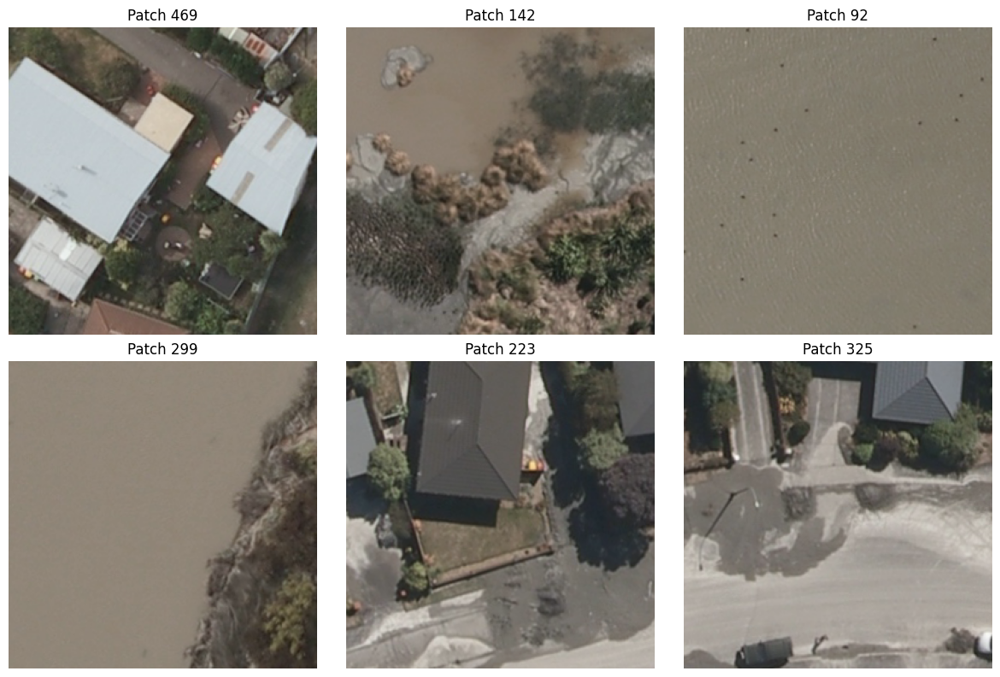

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX241125
  Files in ZIP: ['BX241125.aux', 'BX241125.aux.aux.xml', 'BX241125.tfw', 'BX241125.tif', 'BX241125.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241125.tif

Tile ID: BX241125
Risk Category: high_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 255
Mean value: 96.92

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


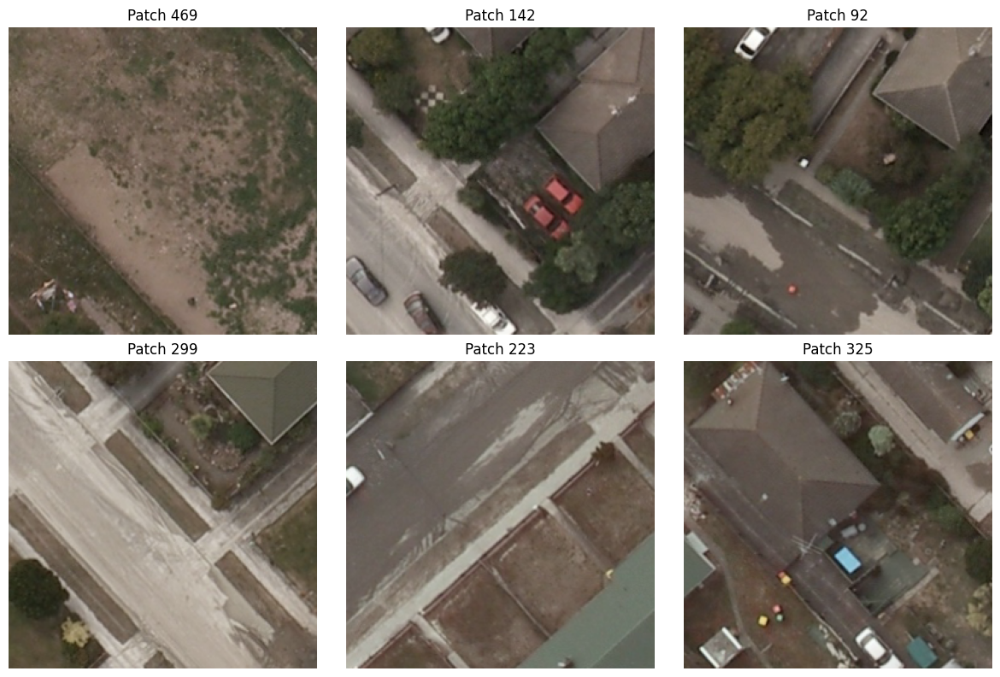

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX241722
  Files in ZIP: ['BX241722.aux', 'BX241722.aux.aux.xml', 'BX241722.tfw', 'BX241722.tif', 'BX241722.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241722.tif

Tile ID: BX241722
Risk Category: high_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 97.68

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


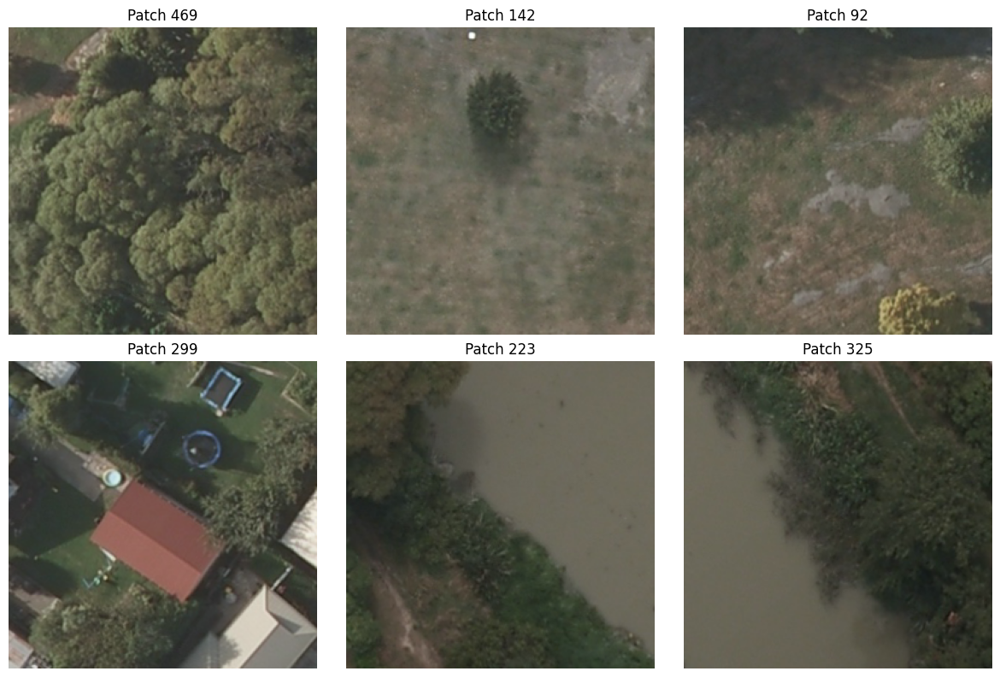

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX241714
  Files in ZIP: ['BX241714.aux', 'BX241714.aux.aux.xml', 'BX241714.tfw', 'BX241714.tif', 'BX241714.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241714.tif

Tile ID: BX241714
Risk Category: high_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 113.79

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


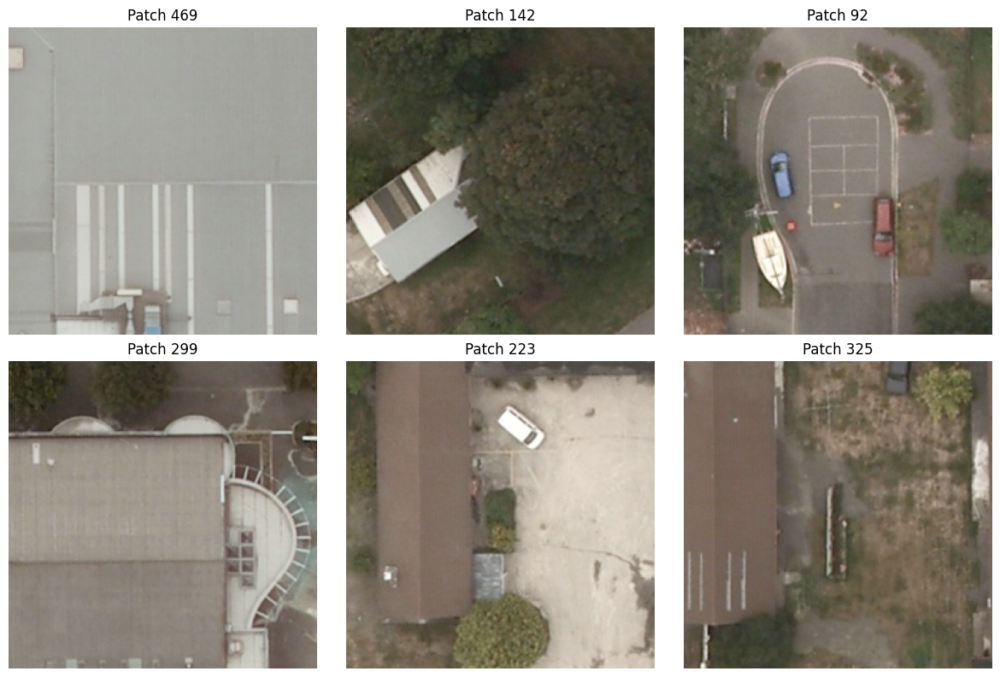

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

############################################################
Processing MEDIUM_RISK tiles
############################################################

Processing tile: BX241420
  Files in ZIP: ['BX241420.aux', 'BX241420.aux.aux.xml', 'BX241420.tfw', 'BX241420.tif', 'BX241420.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241420.tif

Tile ID: BX241420
Risk Category: medium_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 104.50

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


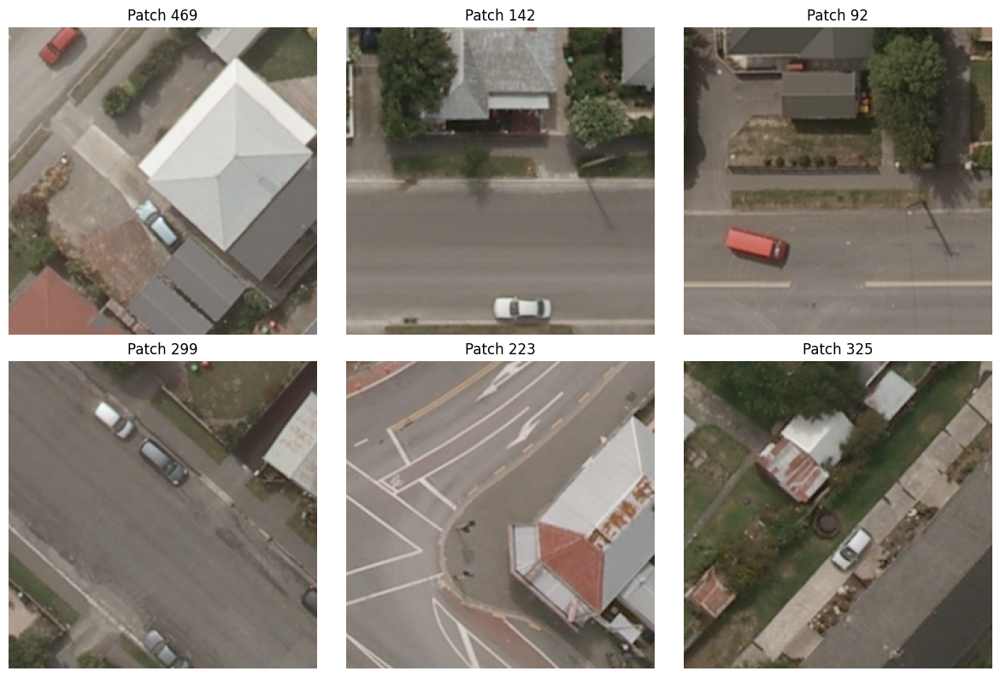

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX241520
  Files in ZIP: ['BX241520.aux', 'BX241520.aux.aux.xml', 'BX241520.tfw', 'BX241520.tif', 'BX241520.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241520.tif

Tile ID: BX241520
Risk Category: medium_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 98.42

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


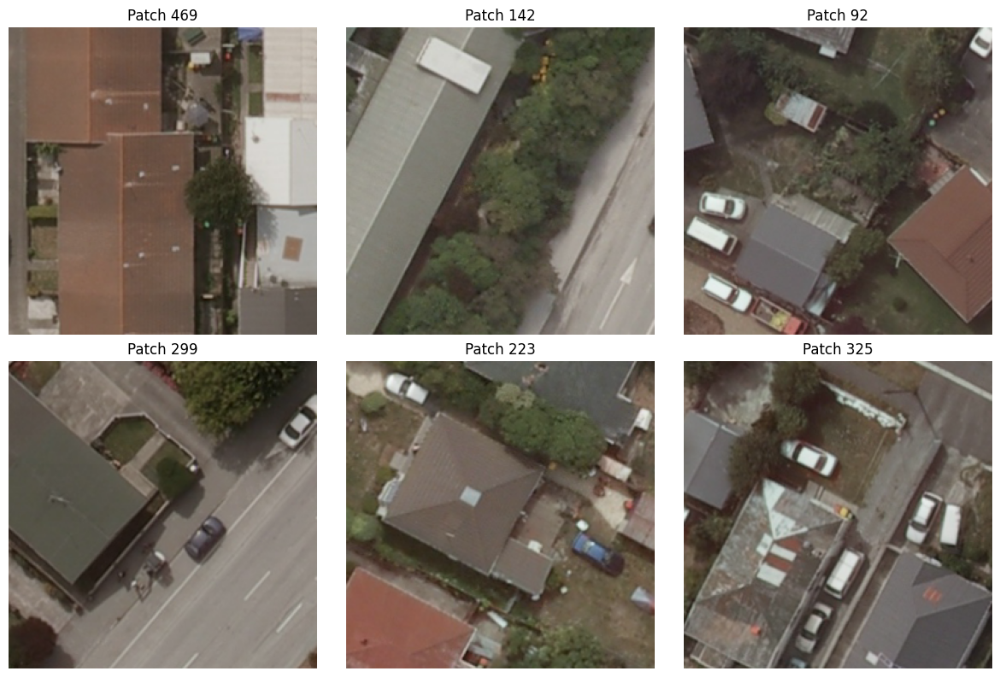

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX241809
  Files in ZIP: ['BX241809.aux', 'BX241809.aux.aux.xml', 'BX241809.tfw', 'BX241809.tif', 'BX241809.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241809.tif

Tile ID: BX241809
Risk Category: medium_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 96.90

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


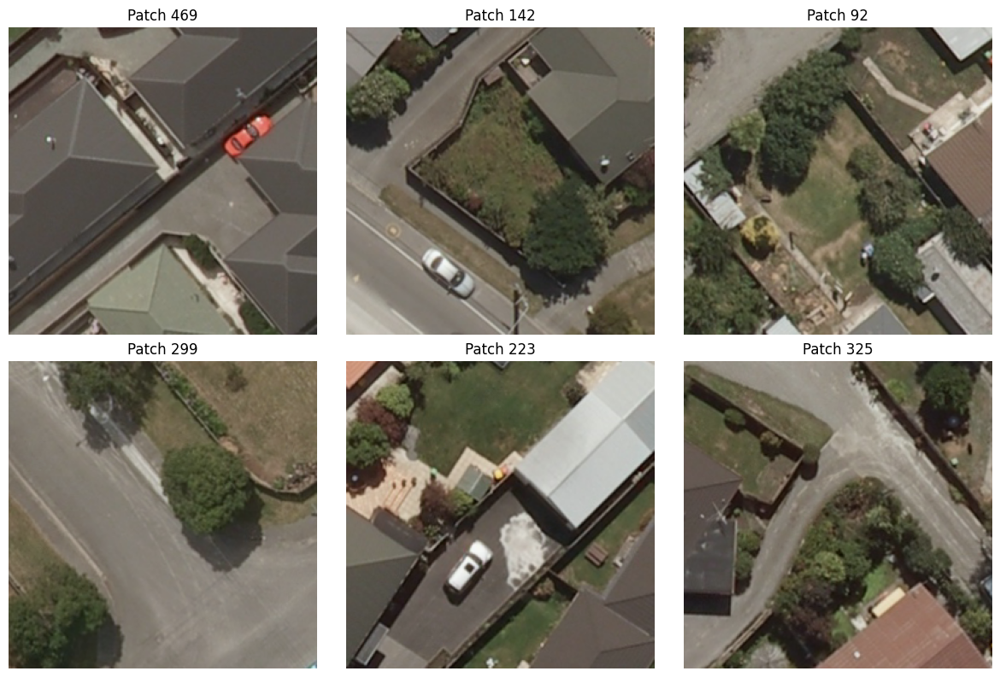

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX241812
  Files in ZIP: ['BX241812.aux', 'BX241812.aux.aux.xml', 'BX241812.tfw', 'BX241812.tif', 'BX241812.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX241812.tif

Tile ID: BX241812
Risk Category: medium_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 94.51

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


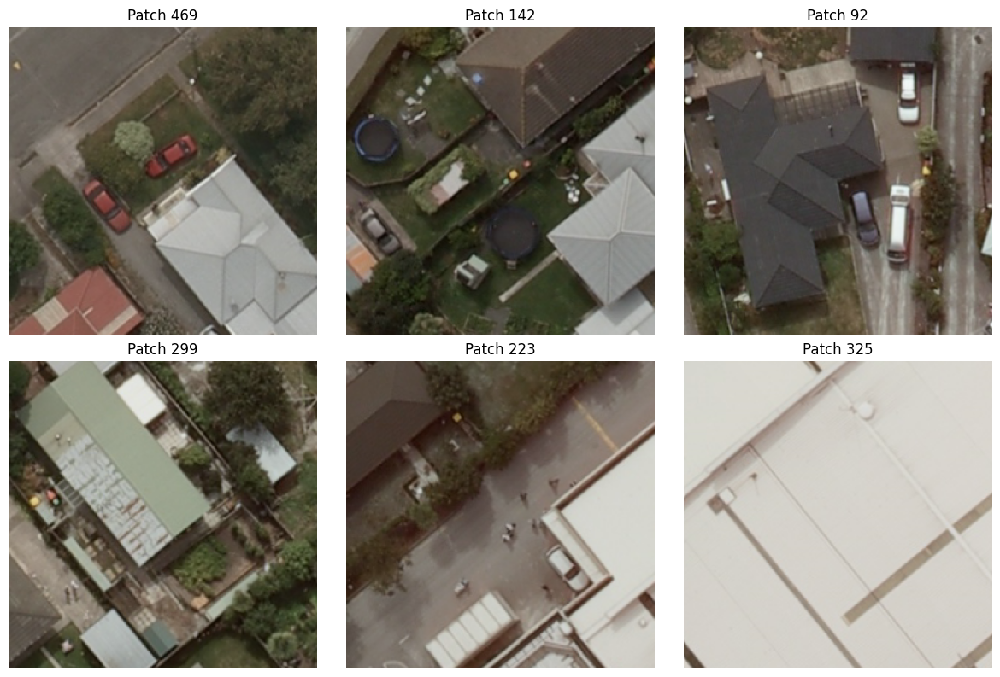

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

############################################################
Processing LOW_RISK tiles
############################################################

Processing tile: BX240720
  Files in ZIP: ['BX240720.aux', 'BX240720.aux.aux.xml', 'BX240720.tfw', 'BX240720.tif', 'BX240720.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX240720.tif

Tile ID: BX240720
Risk Category: low_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 89.58

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


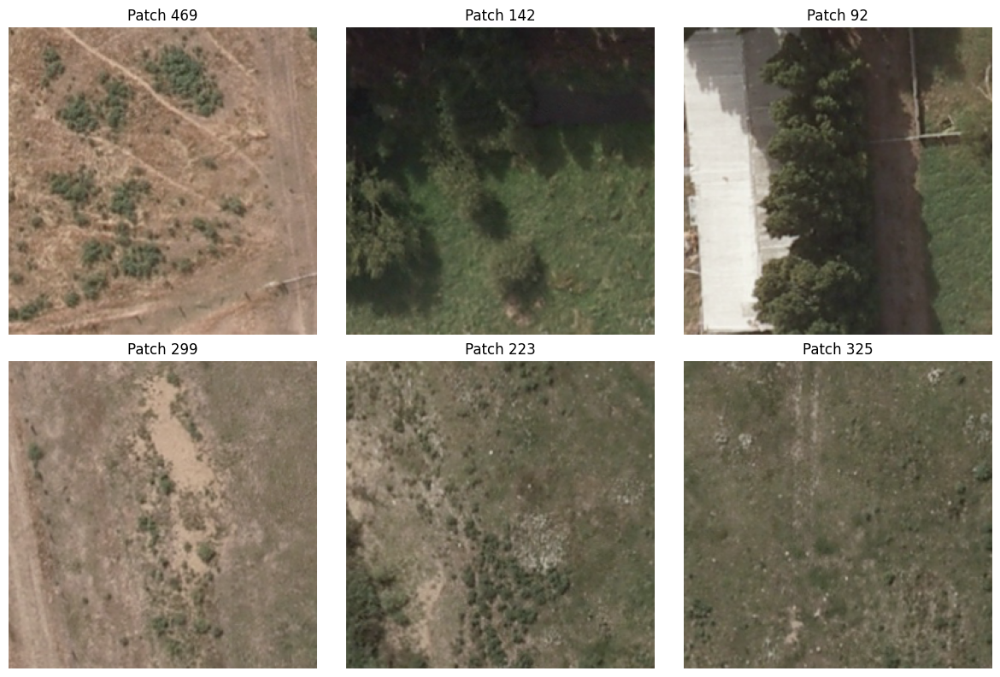

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX231644
  Files in ZIP: ['BX231644.aux', 'BX231644.aux.aux.xml', 'BX231644.tfw', 'BX231644.tif', 'BX231644.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX231644.tif

Tile ID: BX231644
Risk Category: low_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 255
Mean value: 114.25

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


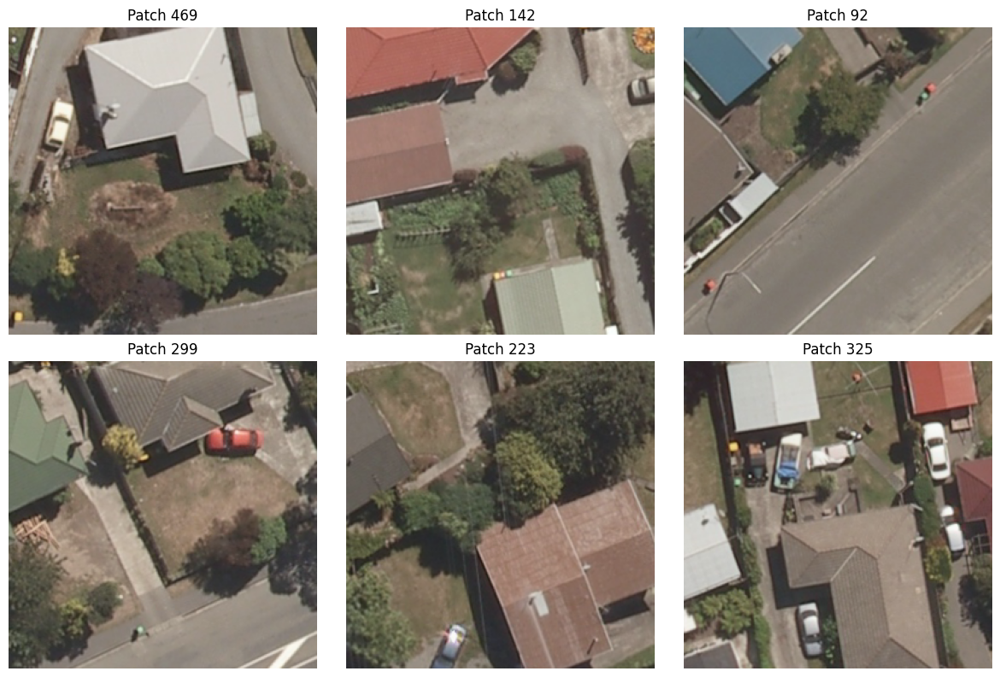

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX231544
  Files in ZIP: ['BX231544.aux', 'BX231544.aux.aux.xml', 'BX231544.tfw', 'BX231544.tif', 'BX231544.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX231544.tif

Tile ID: BX231544
Risk Category: low_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 113.77

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


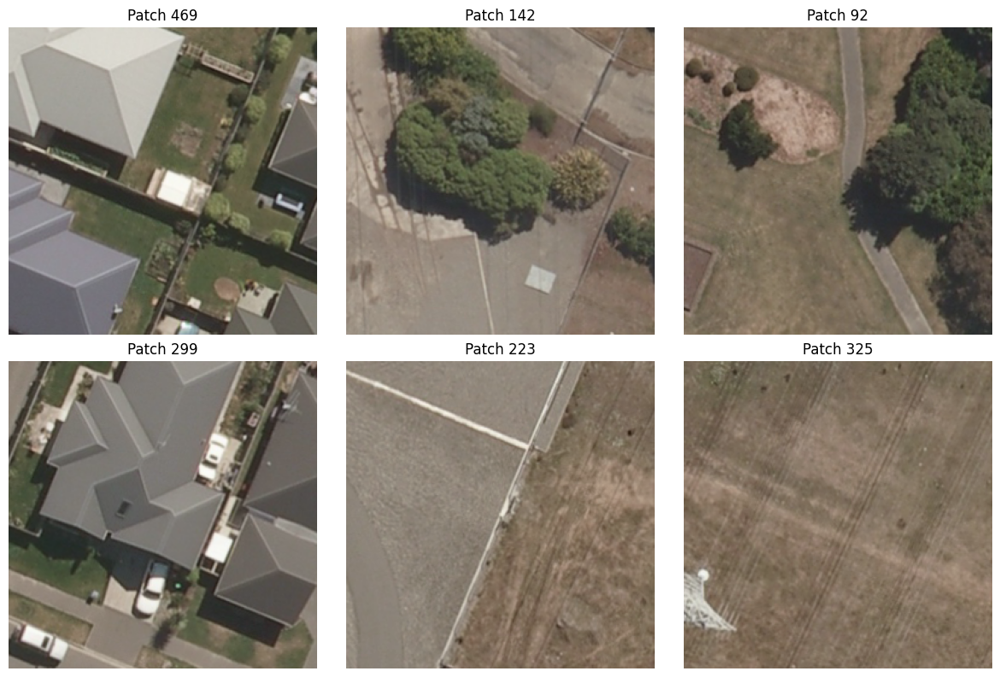

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

Processing tile: BX231250
  Files in ZIP: ['BX231250.aux', 'BX231250.aux.aux.xml', 'BX231250.tfw', 'BX231250.tif', 'BX231250.xml', 'christchurch-post-earthquake-01m-urban-aerial-photos-24-febr.txt']
  Extracting image: BX231250.tif

Tile ID: BX231250
Risk Category: low_risk
Dimensions: 4800x7200 pixels
Mode: RGB
Format: TIFF
Array shape: (7200, 4800, 3)
Data type: uint8
Min value: 0
Max value: 254
Mean value: 103.78

  Extracting 500 patches of size 256x256...
  Visualizing sample patches...


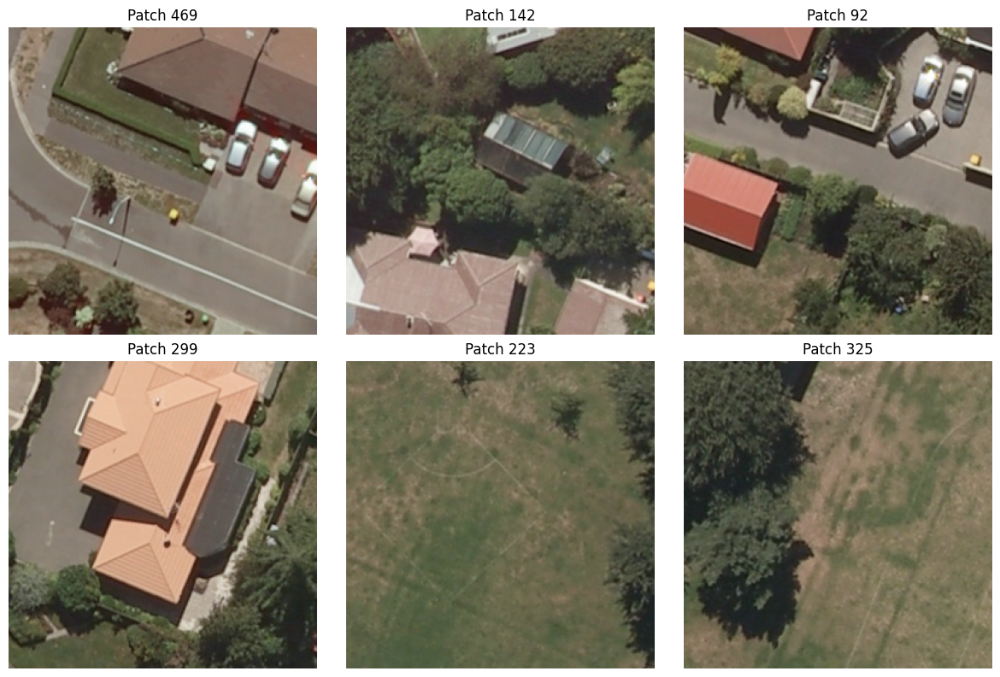

  Saving patches to Dropbox...
  Saved 100/500 patches...
  Saved 200/500 patches...
  Saved 300/500 patches...
  Saved 400/500 patches...
  Saved 500/500 patches...
  Total saved: 500/500 patches

PROCESSING COMPLETE
Total patches extracted: 6000
Saving metadata...

Metadata summary:
{
  "patch_size": 256,
  "num_patches_per_tile": 500,
  "tiles": {
    "BX241229": {
      "risk_category": "high_risk",
      "dimensions": [
        4800,
        7200
      ],
      "num_patches": 500,
      "description": "Suburban/wetland with river",
      "coords": [
        172.72111,
        -43.5175
      ]
    },
    "BX241125": {
      "risk_category": "high_risk",
      "dimensions": [
        4800,
        7200
      ],
      "num_patches": 500,
      "description": "Wainoni park (grass and roads)",
      "coords": [
        172.698101,
        -43.51146219
      ]
    },
    "BX241722": {
      "risk_category": "high_risk",
      "dimensions": [
        4800,
        7200
      ],
      "nu

In [36]:
"""
Liquefaction Risk Prediction - Data Preparation Pipeline (ZIP Support)
Extracts patches from zipped aerial imagery tiles stored in Dropbox
"""

# ============================================================================
# PART 1: SETUP AND IMPORTS
# ============================================================================

# Install required packages
!pip install dropbox pillow numpy matplotlib

import dropbox
import io
import numpy as np
from PIL import Image
import matplotlib.pyplot as plt
from pathlib import Path
import json
import random
import zipfile
from typing import List, Tuple, Dict

# ============================================================================
# PART 2: DROPBOX AUTHENTICATION
# ============================================================================

#DROPBOX_ACCESS_TOKEN = "YOUR_ACCESS_TOKEN_HERE"  # Replace with your token

# Initialize Dropbox client
#dbx = dropbox.Dropbox(DROPBOX_ACCESS_TOKEN)

# ============================================================================
# PART 3: TILE METADATA
# ============================================================================

# Define tile information
TILES_INFO = {
    'high_risk': [
        {'tile_id': 'BX241229', 'coords': (172.72111, -43.51750), 'description': 'Suburban/wetland with river'},
        {'tile_id': 'BX241125', 'coords': (172.6981010, -43.51146219), 'description': 'Wainoni park (grass and roads)'},
        {'tile_id': 'BX241722', 'coords': (172.6808280, -43.54901668), 'description': 'River/industrial area'},
        {'tile_id': 'BX241714', 'coords': (172.6336605, -43.54742813), 'description': '2 lane highway, industrial'}
    ],
    'medium_risk': [
        {'tile_id': 'BX241420', 'coords': (172.6683228, -43.53128358), 'description': 'Suburban/built up main road'},
        {'tile_id': 'BX241520', 'coords': (172.6710959, -43.53552336), 'description': 'Park (grass) and suburb'},
        {'tile_id': 'BX241809', 'coords': (172.6050770, -43.55770704), 'description': 'Suburban with river'},
        {'tile_id': 'BX241812', 'coords': (172.6200621, -43.55659898), 'description': 'Suburban industrial'}
    ],
    'low_risk': [
        {'tile_id': 'BX240720', 'coords': (172.6702853, -43.48648883), 'description': 'Rural with sheds next to main rd'},
        {'tile_id': 'BX231644', 'coords': (172.5153499, -43.54064490), 'description': 'Train line suburban main roads'},
        {'tile_id': 'BX231544', 'coords': (172.5129460, -43.53309273), 'description': 'Field with road and suburban edge'},
        {'tile_id': 'BX231250', 'coords': (172.5532335, -43.51814653), 'description': 'Suburban with stream evidence'}
    ]
}

# ============================================================================
# PART 4: HELPER FUNCTIONS FOR ZIP FILES
# ============================================================================

def load_image_from_zip_in_dropbox(dbx, dropbox_zip_path: str) -> Image.Image:
    """
    Load an image from a ZIP file stored in Dropbox

    Args:
        dbx: Dropbox client
        dropbox_zip_path: Path to ZIP file in Dropbox (e.g., '/Chch tiles/BX241229.zip')

    Returns:
        PIL Image object
    """
    try:
        # Download ZIP file
        print(f"  Downloading ZIP file: {dropbox_zip_path}")
        metadata, response = dbx.files_download(dropbox_zip_path)
        zip_data = response.content

        # Open ZIP file in memory
        with zipfile.ZipFile(io.BytesIO(zip_data)) as zip_file:
            # List files in ZIP
            file_list = zip_file.namelist()
            print(f"  Files in ZIP: {file_list}")

            # Find image file (look for common image extensions)
            image_extensions = ['.tif', '.tiff', '.jpg', '.jpeg', '.png']
            image_file = None

            for file_name in file_list:
                if any(file_name.lower().endswith(ext) for ext in image_extensions):
                    image_file = file_name
                    break

            if image_file is None:
                print(f"  ERROR: No image file found in ZIP. Files present: {file_list}")
                return None

            print(f"  Extracting image: {image_file}")

            # Extract and load image
            image_data = zip_file.read(image_file)
            image = Image.open(io.BytesIO(image_data))

            return image

    except Exception as e:
        print(f"  ERROR loading {dropbox_zip_path}: {e}")
        return None

def inspect_tile_properties(image: Image.Image, tile_id: str, risk_category: str):
    """
    Inspect and print tile properties
    """
    print(f"\n{'='*60}")
    print(f"Tile ID: {tile_id}")
    print(f"Risk Category: {risk_category}")
    print(f"{'='*60}")
    print(f"Dimensions: {image.size[0]}x{image.size[1]} pixels")
    print(f"Mode: {image.mode}")
    print(f"Format: {image.format}")

    # Convert to numpy array for additional info
    img_array = np.array(image)
    print(f"Array shape: {img_array.shape}")
    print(f"Data type: {img_array.dtype}")
    print(f"Min value: {img_array.min()}")
    print(f"Max value: {img_array.max()}")
    print(f"Mean value: {img_array.mean():.2f}")

    return img_array.shape

def extract_patches(image: Image.Image, patch_size: int = 256,
                   num_patches: int = 500, seed: int = 42) -> List[np.ndarray]:
    """
    Extract random patches from an image
    """
    random.seed(seed)
    np.random.seed(seed)

    img_array = np.array(image)
    height, width = img_array.shape[:2]

    patches = []

    # Calculate valid extraction regions
    max_y = height - patch_size
    max_x = width - patch_size

    if max_y <= 0 or max_x <= 0:
        print(f"  WARNING: Image too small for patches of size {patch_size}")
        print(f"  Image size: {width}x{height}, Patch size: {patch_size}x{patch_size}")
        return patches

    for i in range(num_patches):
        # Random top-left corner
        y = random.randint(0, max_y)
        x = random.randint(0, max_x)

        # Extract patch
        patch = img_array[y:y+patch_size, x:x+patch_size]
        patches.append(patch)

    return patches

def save_patches_to_dropbox(dbx, patches: List[np.ndarray],
                            tile_id: str, risk_category: str,
                            dropbox_base_path: str = '/patches'):
    """
    Save patches to Dropbox as PNG files
    """
    # Create directory structure
    category_path = f"{dropbox_base_path}/{risk_category}"
    tile_path = f"{category_path}/{tile_id}"

    saved_count = 0

    for idx, patch in enumerate(patches):
        try:
            # Convert numpy array to PNG bytes
            patch_image = Image.fromarray(patch.astype('uint8'))
            buffer = io.BytesIO()
            patch_image.save(buffer, format='PNG')
            buffer.seek(0)

            # Upload to Dropbox
            file_path = f"{tile_path}/patch_{idx:04d}.png"
            dbx.files_upload(buffer.read(), file_path,
                           mode=dropbox.files.WriteMode.overwrite)
            saved_count += 1

            if (idx + 1) % 100 == 0:
                print(f"  Saved {idx + 1}/{len(patches)} patches...")

        except Exception as e:
            print(f"  Error saving patch {idx}: {e}")

    print(f"  Total saved: {saved_count}/{len(patches)} patches")
    return saved_count

def visualize_sample_patches(patches: List[np.ndarray], num_samples: int = 6):
    """
    Visualize a sample of extracted patches
    """
    if len(patches) == 0:
        print("  No patches to visualize")
        return

    sample_indices = random.sample(range(len(patches)), min(num_samples, len(patches)))

    fig, axes = plt.subplots(2, 3, figsize=(12, 8))
    axes = axes.flatten()

    for idx, patch_idx in enumerate(sample_indices):
        axes[idx].imshow(patches[patch_idx])
        axes[idx].set_title(f'Patch {patch_idx}')
        axes[idx].axis('off')

    plt.tight_layout()
    plt.show()

# ============================================================================
# PART 5: MAIN PROCESSING PIPELINE
# ============================================================================

def process_all_tiles(dbx, tiles_info: Dict,
                     dropbox_tiles_path: str = '/Chch tiles',
                     patch_size: int = 256,
                     num_patches_per_tile: int = 500,
                     visualize: bool = True):
    """
    Main pipeline to process all tiles from ZIP files
    """

    metadata = {
        'patch_size': patch_size,
        'num_patches_per_tile': num_patches_per_tile,
        'tiles': {}
    }

    total_patches = 0

    for risk_category, tiles in tiles_info.items():
        print(f"\n{'#'*60}")
        print(f"Processing {risk_category.upper()} tiles")
        print(f"{'#'*60}")

        for tile_info in tiles:
            tile_id = tile_info['tile_id']

            # Construct Dropbox path for ZIP file
            zip_path = f"{dropbox_tiles_path}/{tile_id}.zip"

            print(f"\nProcessing tile: {tile_id}")

            # Load image from ZIP
            image = load_image_from_zip_in_dropbox(dbx, zip_path)

            if image is None:
                print(f"  Skipping {tile_id} due to loading error")
                continue

            # Inspect properties
            shape = inspect_tile_properties(image, tile_id, risk_category)

            # Check if dimensions match expected (within reasonable range)
            if image.size[0] < 4000 or image.size[1] < 4000:
                print(f"  WARNING: Smaller than expected dimensions!")

            # Extract patches
            print(f"\n  Extracting {num_patches_per_tile} patches of size {patch_size}x{patch_size}...")
            patches = extract_patches(image, patch_size, num_patches_per_tile)

            if len(patches) == 0:
                print(f"  ERROR: No patches extracted for {tile_id}")
                continue

            # Visualize sample patches
            if visualize:
                print("  Visualizing sample patches...")
                visualize_sample_patches(patches)

            # Save patches to Dropbox
            print(f"  Saving patches to Dropbox...")
            saved = save_patches_to_dropbox(dbx, patches, tile_id, risk_category)

            # Update metadata
            metadata['tiles'][tile_id] = {
                'risk_category': risk_category,
                'dimensions': image.size,
                'num_patches': saved,
                'description': tile_info['description'],
                'coords': tile_info['coords']
            }

            total_patches += saved

    # Save metadata
    print(f"\n{'='*60}")
    print(f"PROCESSING COMPLETE")
    print(f"{'='*60}")
    print(f"Total patches extracted: {total_patches}")
    print(f"Saving metadata...")

    metadata_json = json.dumps(metadata, indent=2)
    metadata_bytes = metadata_json.encode('utf-8')
    dbx.files_upload(metadata_bytes, '/patches/metadata.json',
                    mode=dropbox.files.WriteMode.overwrite)

    return metadata

# ============================================================================
# PART 6: EXECUTE PIPELINE
# ============================================================================

if __name__ == "__main__":
    print("Starting liquefaction data preparation pipeline (ZIP support)...")

    # Adjust these parameters as needed
    DROPBOX_TILES_PATH = '/Chch tiles'  # Your tiles folder in Dropbox
    PATCH_SIZE = 256  # Patch size
    NUM_PATCHES = 500  # Per tile

    metadata = process_all_tiles(
        dbx=dbx,
        tiles_info=TILES_INFO,
        dropbox_tiles_path=DROPBOX_TILES_PATH,
        patch_size=PATCH_SIZE,
        num_patches_per_tile=NUM_PATCHES,
        visualize=True
    )

    print("\nMetadata summary:")
    print(json.dumps(metadata, indent=2))

# ============================================================================
# PART 7: LOADING PATCHES FOR TRAINING (USE THIS IN FUTURE RUNS)
# ============================================================================

def load_patches_for_training(dbx, metadata_path: str = '/patches/metadata.json',
                              patches_base_path: str = '/patches'):
    """
    Load patches from Dropbox for model training
    Use this function in future notebooks to avoid re-extracting patches
    """
    # Load metadata
    _, response = dbx.files_download(metadata_path)
    metadata = json.loads(response.content)

    patches_data = {'high_risk': [], 'medium_risk': [], 'low_risk': []}
    labels = {'high_risk': [], 'medium_risk': [], 'low_risk': []}

    # Map risk categories to numeric labels
    risk_to_label = {'high_risk': 2, 'medium_risk': 1, 'low_risk': 0}

    for tile_id, tile_info in metadata['tiles'].items():
        risk = tile_info['risk_category']
        num_patches = tile_info['num_patches']

        print(f"Loading {num_patches} patches from {tile_id} ({risk})...")

        for patch_idx in range(num_patches):
            try:
                patch_path = f"{patches_base_path}/{risk}/{tile_id}/patch_{patch_idx:04d}.png"
                _, response = dbx.files_download(patch_path)
                img = Image.open(io.BytesIO(response.content))
                img_array = np.array(img)

                patches_data[risk].append(img_array)
                labels[risk].append(risk_to_label[risk])

            except Exception as e:
                print(f"Error loading patch {patch_idx} from {tile_id}: {e}")

    return patches_data, labels, metadata